In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
from tensorflow.python.client import device_lib
def get_available_devices():
    local_device_protos = device_lib.list_local_devices()
    return [x.name for x in local_device_protos]
print(get_available_devices()) 
import os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import LearningRateScheduler,ModelCheckpoint,ReduceLROnPlateau
import matplotlib.pyplot as plt

['/device:CPU:0', '/device:GPU:0']


## Data : cifar 10

In [2]:
from tensorflow.keras.utils import to_categorical  

#load cifar-10 dataset
(X_tot, y_tot), (X_test, y_test) = tf.keras.datasets.cifar10.load_data()
#one hot encoding
y_test=to_categorical(y_test, num_classes=10)
y_tot=to_categorical(y_tot, num_classes=10)

print(X_tot.shape)
print(y_tot.shape)
print(X_test.shape)
print(y_test.shape)

(50000, 32, 32, 3)
(50000, 10)
(10000, 32, 32, 3)
(10000, 10)


In [3]:
#shuffle data and split data to generate validation data
shuffler = np.random.RandomState(seed=42).permutation(len(X_tot))
X_tot = X_tot[shuffler]
y_tot = y_tot[shuffler]
 
#validation data
X_val=X_tot[0:2000]
y_val=y_tot[0:2000]

X_train=X_tot[2000:]
y_train=y_tot[2000:]

In [16]:
def train(model,path):
    train_datagen = ImageDataGenerator(
            horizontal_flip=True,
            width_shift_range=4, #+-8 pixel shift max
            height_shift_range=4)#+-8 pixel shift max

    reduce_lr = ReduceLROnPlateau(monitor='val_acc', mode='max',factor=0.1,
                                  patience=5, min_lr=0.001, verbose=1)

    #Early stopping
    es = tf.keras.callbacks.EarlyStopping(monitor='val_acc', mode='max', patience=10)
    # checkpoints
    checkpoint = ModelCheckpoint(path, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
    model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.01,momentum=0.9),loss='categorical_crossentropy', metrics = ['acc'])

    train_generator = train_datagen.flow(X_train, y_train, batch_size=128)
    step_size_train=train_generator.n//train_generator.batch_size

    history=model.fit(train_generator,
                        steps_per_epoch=step_size_train,
                        epochs=200,
                        validation_data=(X_val,y_val),
                        callbacks=[reduce_lr,es,checkpoint])
    return history

# Residual block

In [5]:
from utils.evaluate_model import score
model = tf.keras.models.load_model('./full_models/cifar10/resnet_best.h5')
score(model,X_test,y_test,top_n=[3,5])

313/313 - 12s - loss: 0.7722 - acc: 0.8070
custom_resnet
model accuracy: 80.70%
top 3 accuracy: 95.85999846458435
top 5 accuracy: 98.7500011920929


# Standard SE Block

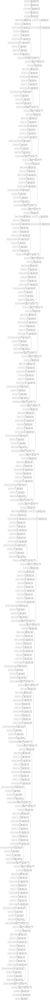

In [47]:
from utils.ablation_resnet import custom_resnet_ablation
resnet_46=custom_resnet_ablation(res_model=[[[3,3],[64,64],4],[[3,3],[128,128],6],[[1,3,1],[256,256,1024],8]],ablation='standard',custom_input=(32,32,3),n_classes=10)
tf.keras.utils.plot_model(resnet_46, to_file='img/ablation_standard.png',show_shapes=True)

In [6]:
model = tf.keras.models.load_model('./full_models/cifar10/SE_resnet_best.h5')
score(model,X_test,y_test,top_n=[3,5])

313/313 - 13s - loss: 0.5569 - acc: 0.8261
SE_custom_resnet46
model accuracy: 82.61%
top 3 accuracy: 96.66000008583069
top 5 accuracy: 98.989999294281


#  SE-PRE block

In [6]:
from utils.ablation_resnet import custom_resnet_ablation
ablation='pre'
resnet_46=custom_resnet_ablation(res_model=[[[3,3],[64,64],4],[[3,3],[128,128],6],[[1,3,1],[256,256,1024],8]],ablation=ablation,custom_input=(32,32,3),n_classes=10)
tf.keras.utils.plot_model(resnet_46, to_file='img/ablation_'+ablation+'.png',show_shapes=True)

In [7]:
path='./models/ablation/se_pre.hdf5'
history=train(resnet_46,path)

Epoch 1/200
375/375 [==============================] - 34s 67ms/step - loss: 3.3343 - acc: 0.1925 - val_loss: 2.0531 - val_acc: 0.2775

Epoch 00001: val_acc improved from -inf to 0.27750, saving model to ./models/ablation/se_pre.hdf5
Epoch 2/200
375/375 [==============================] - 24s 63ms/step - loss: 1.6131 - acc: 0.4218 - val_loss: 1.3774 - val_acc: 0.5025

Epoch 00002: val_acc improved from 0.27750 to 0.50250, saving model to ./models/ablation/se_pre.hdf5
Epoch 3/200
375/375 [==============================] - 24s 64ms/step - loss: 1.4083 - acc: 0.4949 - val_loss: 1.3052 - val_acc: 0.5345

Epoch 00003: val_acc improved from 0.50250 to 0.53450, saving model to ./models/ablation/se_pre.hdf5
Epoch 4/200
375/375 [==============================] - 24s 63ms/step - loss: 1.3264 - acc: 0.5291 - val_loss: 1.2202 - val_acc: 0.5665

Epoch 00004: val_acc improved from 0.53450 to 0.56650, saving model to ./models/ablation/se_pre.hdf5
Epoch 5/200
375/375 [==============================] - 


Epoch 00040: val_acc did not improve from 0.81250
Epoch 41/200
375/375 [==============================] - 23s 62ms/step - loss: 0.2992 - acc: 0.8960 - val_loss: 0.9144 - val_acc: 0.7265

Epoch 00041: val_acc did not improve from 0.81250
Epoch 42/200
375/375 [==============================] - 23s 62ms/step - loss: 0.2935 - acc: 0.8985 - val_loss: 0.6100 - val_acc: 0.8080

Epoch 00042: ReduceLROnPlateau reducing learning rate to 0.001.

Epoch 00042: val_acc did not improve from 0.81250


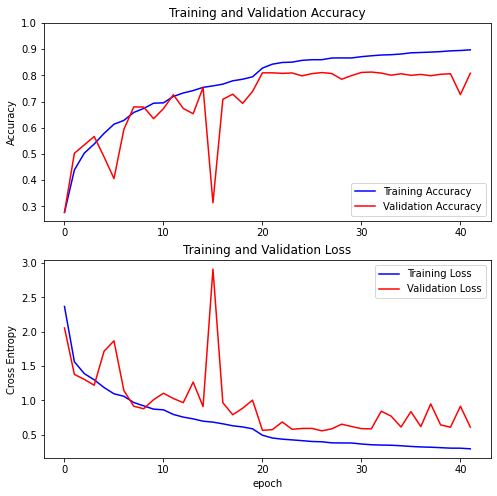

In [8]:
from utils.train_CIFAR_ResNet import plot_model
plot_model(history)

In [9]:
from utils.evaluate_model import score
model=custom_resnet_ablation(res_model=[[[3,3],[64,64],4],[[3,3],[128,128],6],[[1,3,1],[256,256,1024],8]],ablation=ablation,custom_input=(32,32,3),n_classes=10)
model.load_weights(path)
model.save('./full_models/ablation/SE_pre.h5')
del model  # deletes the existing model
model = tf.keras.models.load_model('./full_models/ablation/SE_pre.h5')
score(model,X_test,y_test,top_n=[3,5])

313/313 - 4s - loss: 0.7148 - acc: 0.7892
custom_resnet
model accuracy: 78.92%
top 3 accuracy: 95.39999961853027
top 5 accuracy: 98.89000058174133


# SE Post block

In [10]:
ablation='post'
resnet_46=custom_resnet_ablation(res_model=[[[3,3],[64,64],4],[[3,3],[128,128],6],[[1,3,1],[256,256,1024],8]],ablation=ablation,custom_input=(32,32,3),n_classes=10)
resnet_46.summary()
tf.keras.utils.plot_model(resnet_46, to_file='img/ablation_'+ablation+'.png',show_shapes=True)

Model: "custom_resnet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 16, 16, 64)   9472        input_4[0][0]                    
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1_conv[0][0]                 
__________________________________________________________________________________________________
conv1_relu (ReLU)               (None, 16, 16, 64)   0           conv1_bn[0][0]                   
______________________________________________________________________________________

In [11]:
path='./models/ablation/se_post.hdf5'
history=train(resnet_46,path)

Epoch 1/200
375/375 [==============================] - 30s 66ms/step - loss: 2.3753 - acc: 0.0988 - val_loss: 2.3068 - val_acc: 0.1115

Epoch 00001: val_acc improved from -inf to 0.11150, saving model to ./models/ablation/se_post.hdf5
Epoch 2/200
375/375 [==============================] - 24s 63ms/step - loss: 2.0419 - acc: 0.2106 - val_loss: 2.2767 - val_acc: 0.1675

Epoch 00002: val_acc improved from 0.11150 to 0.16750, saving model to ./models/ablation/se_post.hdf5
Epoch 3/200
375/375 [==============================] - 24s 63ms/step - loss: 1.8486 - acc: 0.2886 - val_loss: 1.8499 - val_acc: 0.3360

Epoch 00003: val_acc improved from 0.16750 to 0.33600, saving model to ./models/ablation/se_post.hdf5
Epoch 4/200
375/375 [==============================] - 24s 64ms/step - loss: 1.8044 - acc: 0.3166 - val_loss: 1.8150 - val_acc: 0.3455

Epoch 00004: val_acc improved from 0.33600 to 0.34550, saving model to ./models/ablation/se_post.hdf5
Epoch 5/200
375/375 [==============================

375/375 [==============================] - 24s 64ms/step - loss: 0.6359 - acc: 0.7871 - val_loss: 0.7797 - val_acc: 0.7390

Epoch 00039: val_acc did not improve from 0.75950
Epoch 40/200
375/375 [==============================] - 24s 63ms/step - loss: 0.6267 - acc: 0.7896 - val_loss: 0.8574 - val_acc: 0.7270

Epoch 00040: val_acc did not improve from 0.75950
Epoch 41/200
375/375 [==============================] - 23s 62ms/step - loss: 0.6197 - acc: 0.7946 - val_loss: 0.8989 - val_acc: 0.7220

Epoch 00041: val_acc did not improve from 0.75950
Epoch 42/200
375/375 [==============================] - 23s 62ms/step - loss: 0.5986 - acc: 0.7998 - val_loss: 0.6677 - val_acc: 0.7800

Epoch 00042: val_acc improved from 0.75950 to 0.78000, saving model to ./models/ablation/se_post.hdf5
Epoch 43/200
375/375 [==============================] - 23s 62ms/step - loss: 0.6052 - acc: 0.8001 - val_loss: 0.8652 - val_acc: 0.7155

Epoch 00043: val_acc did not improve from 0.78000
Epoch 44/200
375/375 [====

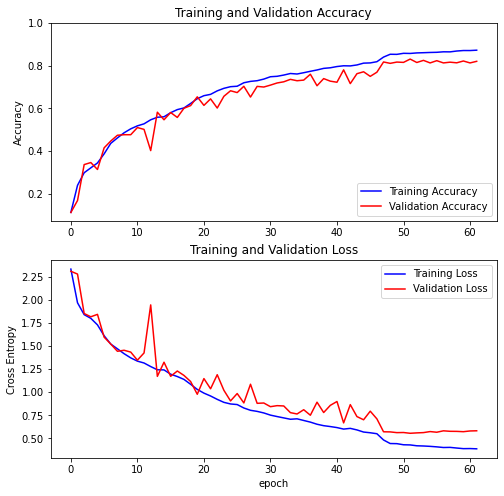

In [12]:
plot_model(history)

In [13]:
model=custom_resnet_ablation(res_model=[[[3,3],[64,64],4],[[3,3],[128,128],6],[[1,3,1],[256,256,1024],8]],ablation=ablation,custom_input=(32,32,3),n_classes=10)
model.load_weights(path)
model.save('./full_models/ablation/SE_post.h5')
del model  # deletes the existing model
model = tf.keras.models.load_model('./full_models/ablation/SE_post.h5')
score(model,X_test,y_test,top_n=[3,5])

313/313 - 4s - loss: 0.6217 - acc: 0.7998
custom_resnet
model accuracy: 79.98%
top 3 accuracy: 94.55000162124634
top 5 accuracy: 98.0400025844574


# SE Identity block

In [17]:
ablation='identity'
resnet_46=custom_resnet_ablation(res_model=[[[3,3],[64,64],4],[[3,3],[128,128],6],[[1,3,1],[256,256,1024],8]],ablation=ablation,custom_input=(32,32,3),n_classes=10)
resnet_46.summary()
tf.keras.utils.plot_model(resnet_46, to_file='img/ablation_'+ablation+'.png',show_shapes=True)

Model: "custom_resnet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 16, 16, 64)   9472        input_7[0][0]                    
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 16, 16, 64)   256         conv1_conv[0][0]                 
__________________________________________________________________________________________________
conv1_relu (ReLU)               (None, 16, 16, 64)   0           conv1_bn[0][0]                   
______________________________________________________________________________________

In [18]:
path='./models/ablation/se_identity.hdf5'
history=train(resnet_46,path)

Epoch 1/200
375/375 [==============================] - 31s 68ms/step - loss: 2.4474 - acc: 0.1083 - val_loss: 2.4346 - val_acc: 0.1135

Epoch 00001: val_acc improved from -inf to 0.11350, saving model to ./models/ablation/se_identity.hdf5
Epoch 2/200
375/375 [==============================] - 24s 65ms/step - loss: 2.0920 - acc: 0.2013 - val_loss: 2.7949 - val_acc: 0.1025

Epoch 00002: val_acc did not improve from 0.11350
Epoch 3/200
375/375 [==============================] - 24s 65ms/step - loss: 1.9342 - acc: 0.2540 - val_loss: 1.8811 - val_acc: 0.2450

Epoch 00003: val_acc improved from 0.11350 to 0.24500, saving model to ./models/ablation/se_identity.hdf5
Epoch 4/200
375/375 [==============================] - 25s 65ms/step - loss: 1.8611 - acc: 0.2802 - val_loss: 1.8595 - val_acc: 0.2945

Epoch 00004: val_acc improved from 0.24500 to 0.29450, saving model to ./models/ablation/se_identity.hdf5
Epoch 5/200
375/375 [==============================] - 24s 64ms/step - loss: 1.8184 - acc: 

375/375 [==============================] - 24s 64ms/step - loss: 1.3736 - acc: 0.5014 - val_loss: 1.5640 - val_acc: 0.4655

Epoch 00041: val_acc did not improve from 0.48750
Epoch 42/200
375/375 [==============================] - 24s 64ms/step - loss: 1.4049 - acc: 0.4924 - val_loss: 1.4675 - val_acc: 0.4755

Epoch 00042: val_acc did not improve from 0.48750
Epoch 43/200
375/375 [==============================] - 24s 64ms/step - loss: 1.4497 - acc: 0.4675 - val_loss: 1.5634 - val_acc: 0.4520

Epoch 00043: val_acc did not improve from 0.48750
Epoch 44/200
375/375 [==============================] - 25s 65ms/step - loss: 1.4108 - acc: 0.4887 - val_loss: 1.5933 - val_acc: 0.4335

Epoch 00044: val_acc did not improve from 0.48750
Epoch 45/200
375/375 [==============================] - 24s 64ms/step - loss: 1.3953 - acc: 0.4962 - val_loss: 2.0393 - val_acc: 0.3265

Epoch 00045: val_acc did not improve from 0.48750
Epoch 46/200
375/375 [==============================] - 24s 64ms/step - loss: 

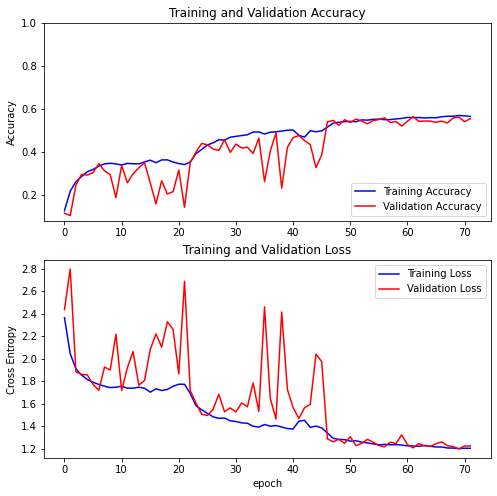

In [22]:
plot_model(history)

In [21]:
model=custom_resnet_ablation(res_model=[[[3,3],[64,64],4],[[3,3],[128,128],6],[[1,3,1],[256,256,1024],8]],ablation=ablation,custom_input=(32,32,3),n_classes=10)
model.load_weights(path)
model.save('./full_models/ablation/SE_identity.h5')
del model  # deletes the existing model
model = tf.keras.models.load_model('./full_models/ablation/SE_identity.h5')
score(model,X_test,y_test,top_n=[3,5])

313/313 - 4s - loss: 1.2254 - acc: 0.5622
custom_resnet
model accuracy: 56.22%
top 3 accuracy: 84.52000021934509
top 5 accuracy: 93.97000074386597
